## Business Understanding

In [27]:
from pathlib import Path
from PIL import Image, UnidentifiedImageError
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import hashlib
import os

In [28]:
ROOT_DIR = Path("C:\\Users\\justi\\OneDrive\\Documents\\Waste_Vision\\routeeventlog")
OUTPUT_CSV = "data_understanding_overview.csv"
SAMPLE_SIZE = 20000
IMAGE_EXTENSIONS = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

In [29]:
records = []

for cat in tqdm(list(ROOT_DIR.iterdir()), desc="Hoofdfolders"):
    if not cat.is_dir():
        continue
    for subfolder in cat.rglob("*"):
        if not subfolder.is_dir():
            continue
        imgs = [p for p in subfolder.glob("**/*") if p.suffix.lower() in IMAGE_EXTENSIONS]
        
        records.append({
            "hoofdcategorie": cat.name,
            "subfolder": subfolder.name,
            "aantal_fotos": len(imgs),
            "pad": str(subfolder)
        })

df_structure = pd.DataFrame(records)
print(f"\nAantal hoofdcategorieën: {df_structure['hoofdcategorie'].nunique()}")
print(f"Totaal aantal subfolders: {len(df_structure)}")
print(df_structure.groupby('hoofdcategorie')["aantal_fotos"].describe())

Hoofdfolders: 100%|██████████| 29/29 [00:28<00:00,  1.03it/s]


Aantal hoofdcategorieën: 29
Totaal aantal subfolders: 33664
                                        count       mean         std  min  \
hoofdcategorie                                                              
0a4cde88-b495-4563-ac21-92557a3f236f   5887.0   1.936470   11.801883  1.0   
0eb5fd40-2248-40f5-a9f0-c26d9bf7a60a      1.0   1.000000         NaN  1.0   
226b9a12-05f4-4b89-a71a-4bd411fc3f43      4.0   1.000000    0.000000  1.0   
27316bd8-a43b-4e01-a473-7296448ce944   1393.0   2.105528   24.090220  1.0   
2fe482ee-1b4a-430f-b76d-d886ad3c24ca   2238.0   2.130474   26.078026  1.0   
3a8d8c67-1cc9-4510-b352-2c9ad4a87236     59.0   1.440678    0.876340  1.0   
4568d455-7ad6-47ab-b19f-9701e4c3d153     25.0   1.120000    0.331662  1.0   
4de72acc-a34e-4b93-b1a8-812344ad7700    107.0   1.242991    1.044673  1.0   
55155769-7330-48ee-a7cd-ff4d332b6637     28.0   1.107143    0.314970  1.0   
80ac95d1-5941-4890-ac8f-84e70313a1fd      7.0   1.142857    0.377964  1.0   
83d0caa0-ffa5-4

In [30]:
all_images = [p for p in ROOT_DIR.rglob("*") if p.suffix.lower() in IMAGE_EXTENSIONS]

meta = []

for path in tqdm(all_images, desc="Metadata analyse (alle afbeeldingen)"):
    try:
        with Image.open(path) as img:
            meta.append({
                "bestand": str(path),
                "breedte": img.width,
                "hoogte": img.height,
                "ratio": round(img.width / img.height, 2),
                "mode": img.mode,
                "formaat": img.format
            })
    except UnidentifiedImageError:
        continue

df_meta = pd.DataFrame(meta)
print(df_meta.describe())


Metadata analyse (alle afbeeldingen): 100%|██████████| 90498/90498 [09:24<00:00, 160.43it/s]


            breedte        hoogte         ratio
count  90498.000000  90498.000000  90498.000000
mean     446.586168    424.976994      1.077696
std      196.494858    137.713819      0.292477
min      279.000000    270.000000      0.600000
25%      349.000000    349.000000      0.750000
50%      458.000000    349.000000      1.330000
75%      466.000000    466.000000      1.340000
max     2048.000000   2048.000000      1.780000


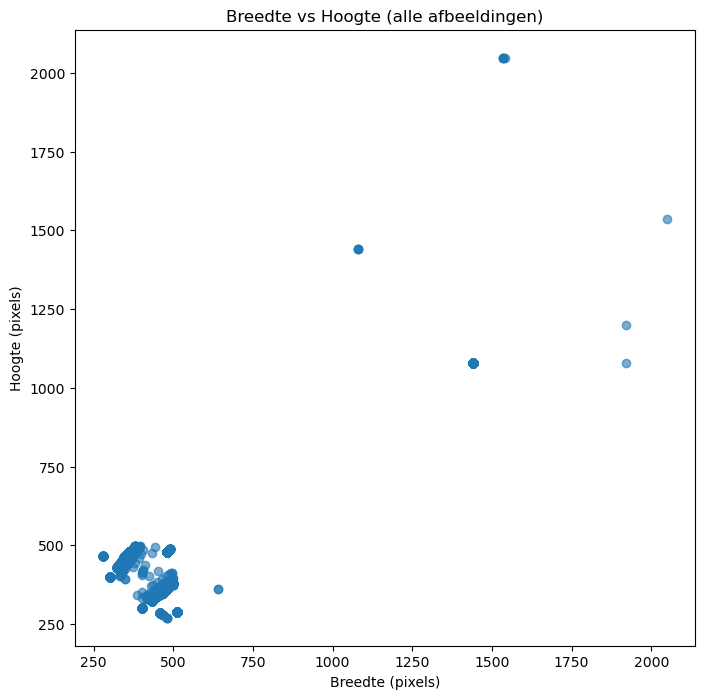

In [39]:
plt.figure(figsize=(8,8))
plt.scatter(df_meta["breedte"], df_meta["hoogte"], alpha=0.6)
plt.title("Breedte vs Hoogte (alle afbeeldingen)")
plt.xlabel("Breedte (pixels)")
plt.ylabel("Hoogte (pixels)")
plt.show()


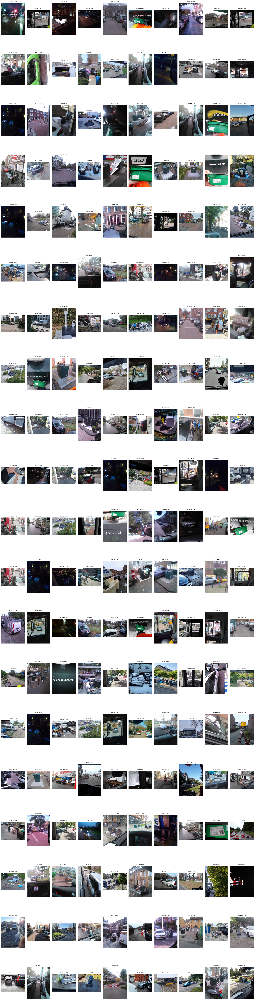

In [42]:
num_images = min(200, len(all_images))
cols = 10 
rows = (num_images + cols - 1) // cols 

plt.figure(figsize=(20, 4*rows))
for i, path in enumerate(random.sample(all_images, num_images)):
    try:
        with Image.open(path) as img:
            plt.subplot(rows, cols, i+1)
            plt.imshow(img)
            plt.title(path.parent.name[:12], fontsize=6)
            plt.axis("off")
    except:
        continue
plt.tight_layout()
plt.show()

Hashing sample: 100%|██████████| 1000/1000 [00:01<00:00, 782.86it/s]

Aantal mogelijke duplicaten in sample: 226
